**Dataset Link- https://universe.roboflow.com/abb-project-mtvf3/obb-3rkid/dataset/1#**

In [3]:
!nvidia-smi

Thu Oct 30 09:12:52 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   42C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 33.0 MB/s eta 0:00:00


In [5]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.222 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 39.6/112.6 GB disk)


In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="nJBC3Kr2Z6qyZZJgYERo")
project = rf.workspace("abb-project-mtvf3").project("obb-3rkid")
version = project.version(1)
dataset = version.download("yolov11")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 22.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 90.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 113.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to OBB-1 in yolov11:: 100%|██████████| 842/842 [00:00<00:00, 9389.69it/s]


In [7]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n-obb.pt")  # load a pretrained model (recommended for training)

# Train the model
results = model.train(data="/content/OBB-1/data.yaml", epochs=30, imgsz=640)

Ultralytics 8.3.222 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/OBB-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-obb.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=1

In [8]:
from ultralytics import YOLO

# Load a model
model = YOLO("/content/runs/obb/train/weights/best.pt")  # load a custom model

# Validate the model
metrics = model.val(data="/content/OBB-1/data.yaml")  # no arguments needed, dataset and settings remembered
metrics.box.map  # map50-95(B)
metrics.box.map50  # map50(B)
metrics.box.map75  # map75(B)
metrics.box.maps  # a list contains map50-95(B) of each category

Ultralytics 8.3.222 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n-obb summary (fused): 109 layers, 2,654,308 parameters, 0 gradients, 6.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1494.4±313.1 MB/s, size: 39.7 KB)
val: Scanning /content/OBB-1/valid/labels.cache... 35 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 35/35 65.5Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.8it/s 1.7s
                   all         35        113      0.998          1      0.995      0.953
                circle          9         22      0.994          1      0.995      0.995
               hexagon         29         59      0.999          1      0.995      0.946
                  star         13         32          1          1      0.995      0.918
Speed: 6.8ms preprocess, 15.7ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to /content/runs/obb/val


array([      0.995,     0.94648,     0.91824])


image 1/17 /content/OBB-1/test/images/Image__2025-09-09__09-55-29_jpg.rf.032cd7ea3d934ceccce128d8ac6b0d94.jpg: 640x640 3 circles, 3 hexagons, 2 stars, 10.5ms
image 2/17 /content/OBB-1/test/images/Image__2025-09-09__09-56-06_jpg.rf.130dd1559f584e4e6d9d28254eb1d01e.jpg: 640x640 3 circles, 2 hexagons, 1 star, 8.6ms
image 3/17 /content/OBB-1/test/images/Image__2025-09-09__09-56-12_jpg.rf.0bff1f6f90256b9fc4ef0dcb4d49e21f.jpg: 640x640 2 circles, 2 hexagons, 1 star, 8.5ms
image 4/17 /content/OBB-1/test/images/Image__2025-09-09__09-57-47_jpg.rf.fec6f16608137f33518bd85a31d4b41e.jpg: 640x640 2 stars, 8.5ms
image 5/17 /content/OBB-1/test/images/Image__2025-09-09__10-01-03_jpg.rf.90184bc82b91574b9ea89d956e977647.jpg: 640x640 3 hexagons, 8.6ms
image 6/17 /content/OBB-1/test/images/Image__2025-09-09__10-01-07_jpg.rf.73d9156cea6b5115549da45fe61fe7c1.jpg: 640x640 3 hexagons, 8.5ms
image 7/17 /content/OBB-1/test/images/Image__2025-09-09__10-03-33_jpg.rf.41e5dffb21350063ad6357f3e5a95e52.jpg: 640x640 2 

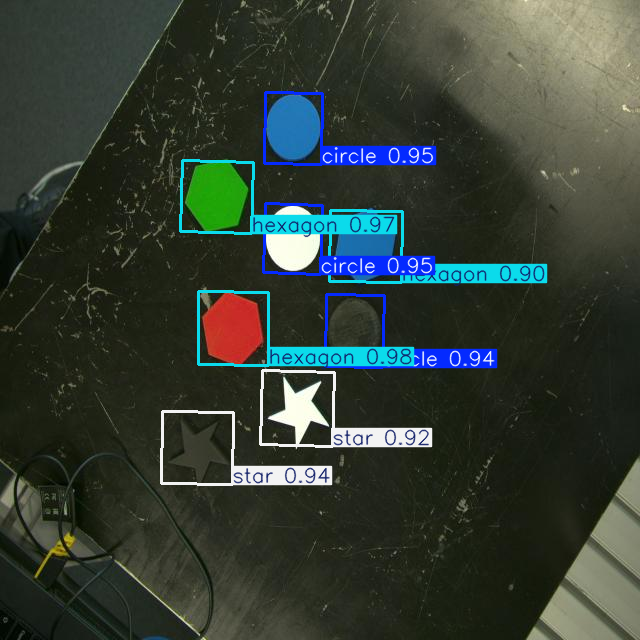

None


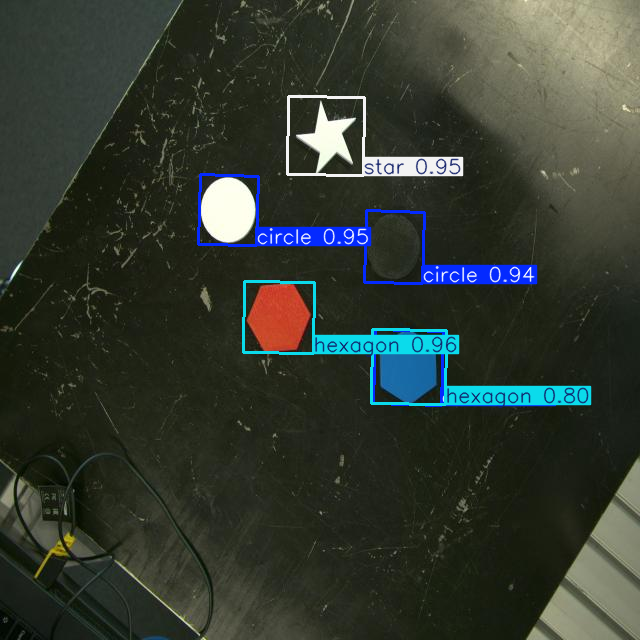

None


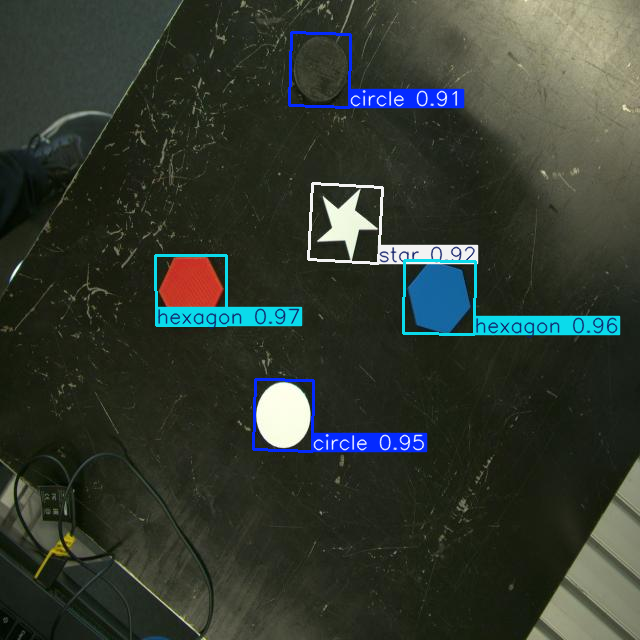

None


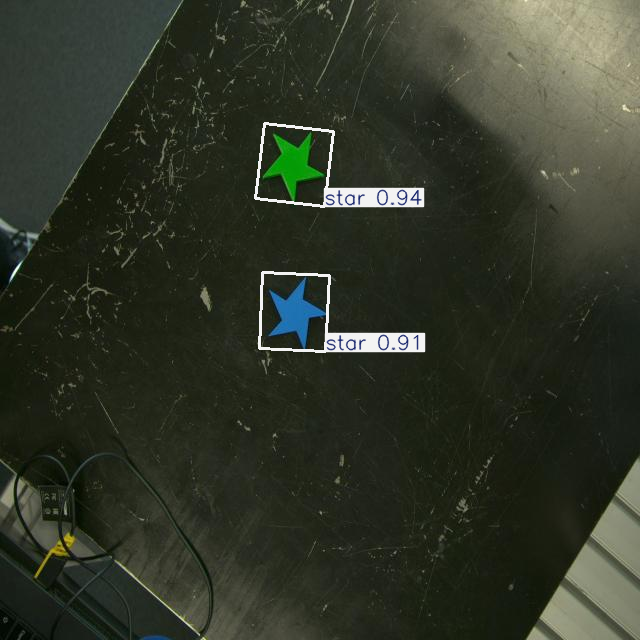

None


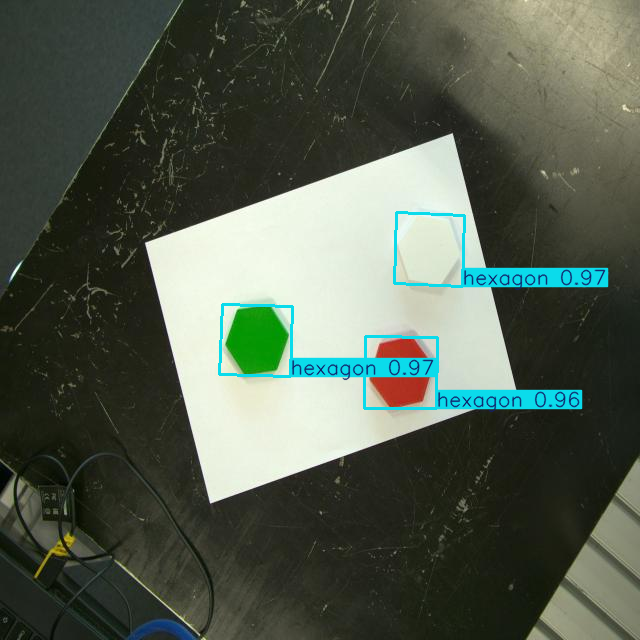

None


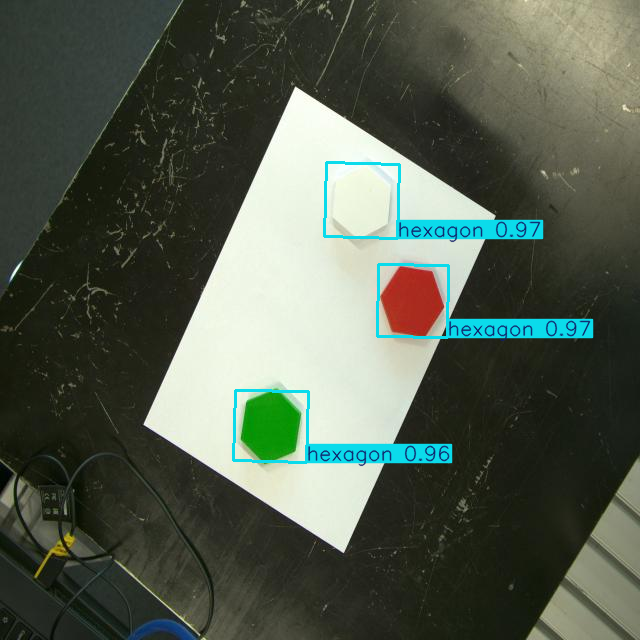

None


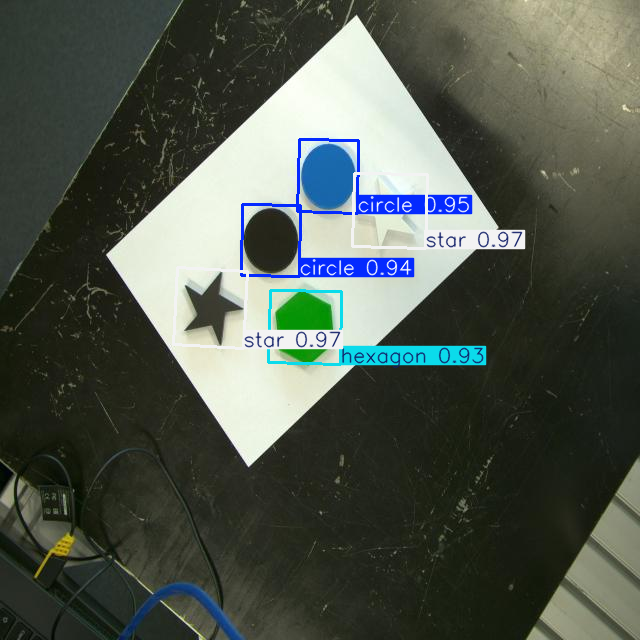

None


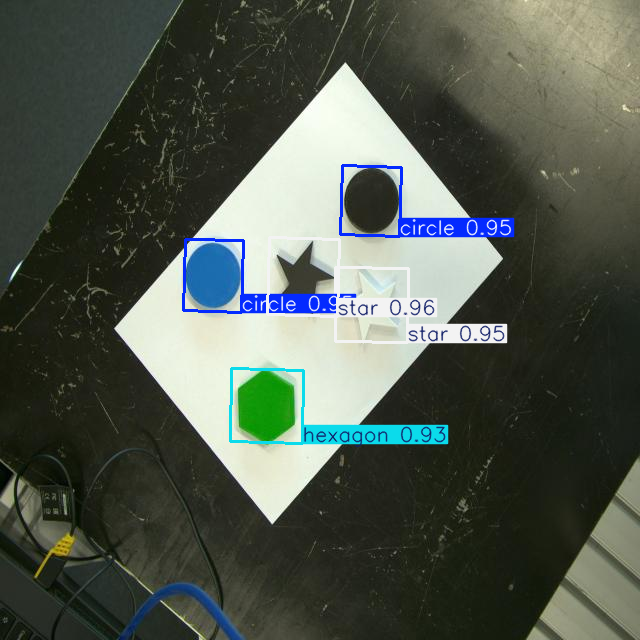

None


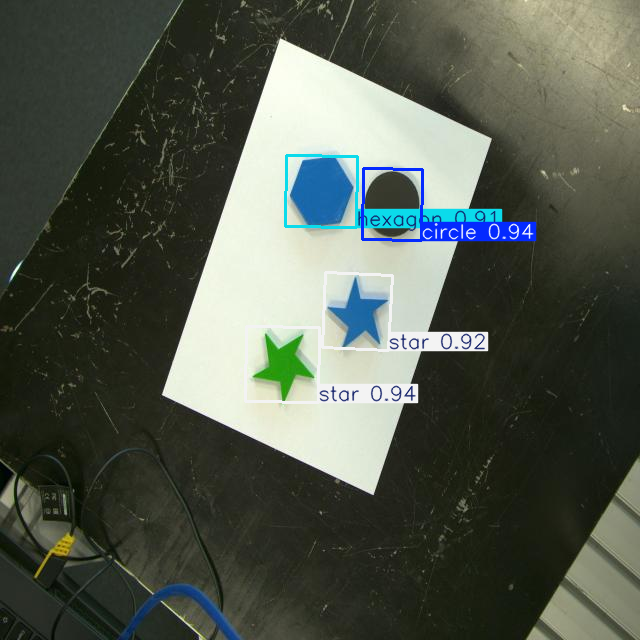

None


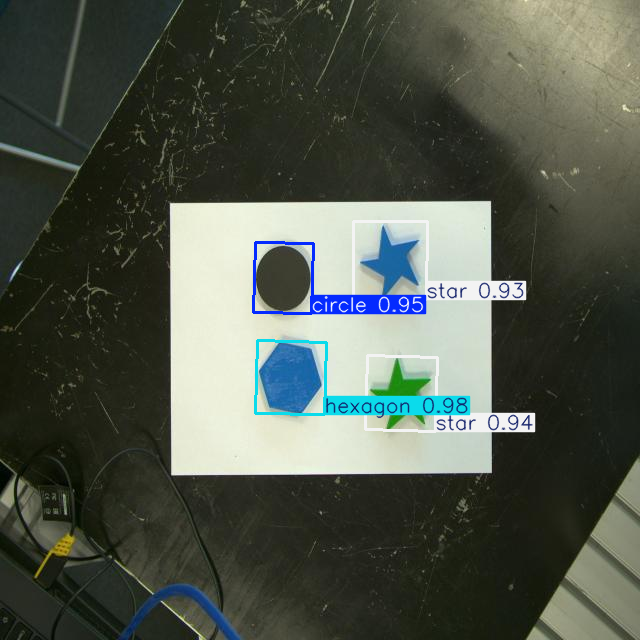

None


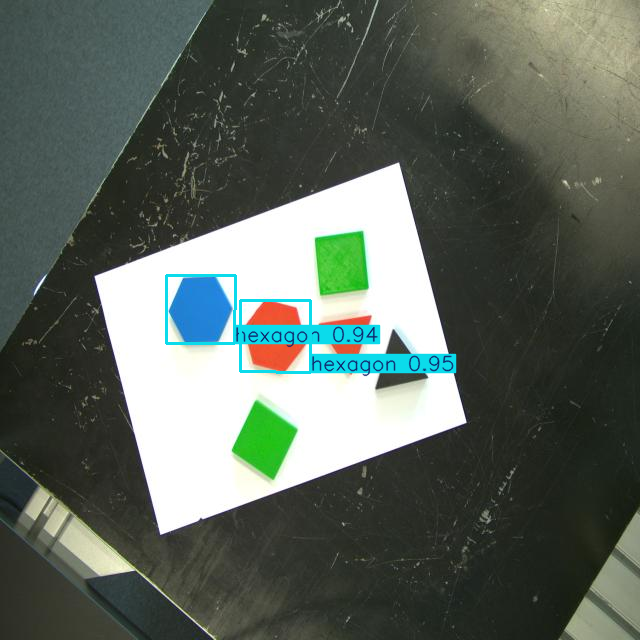

None


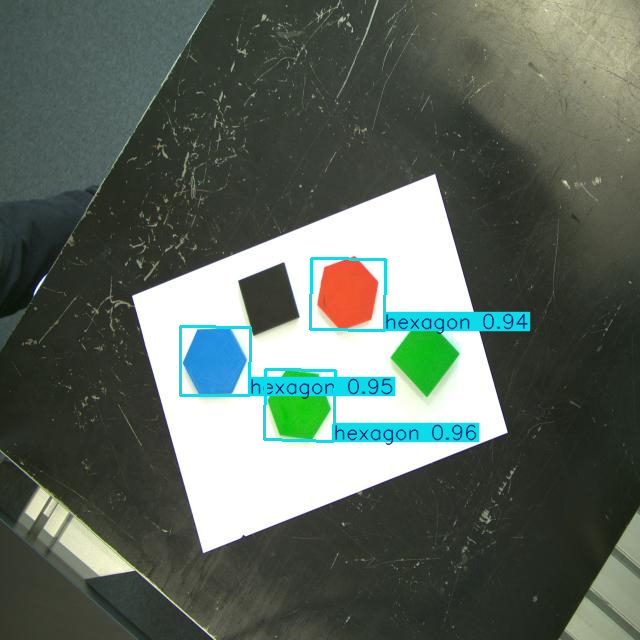

None


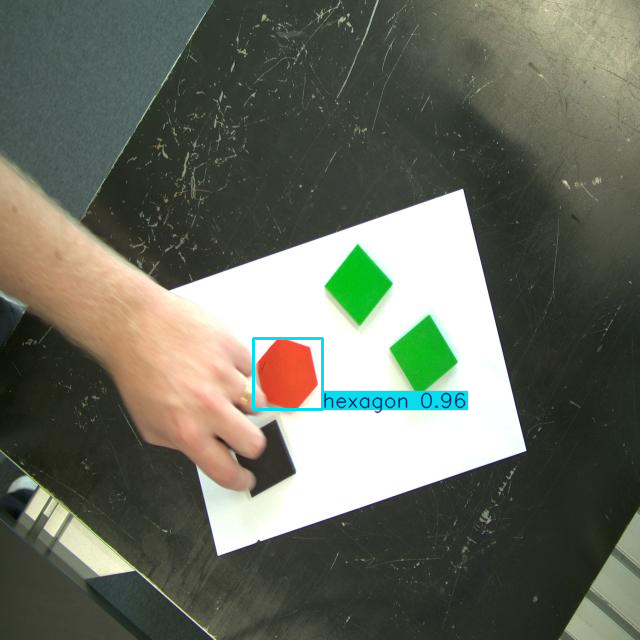

None


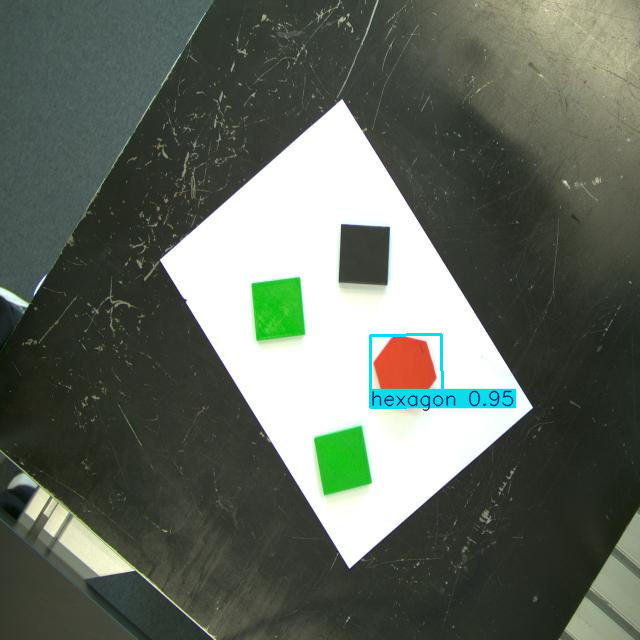

None


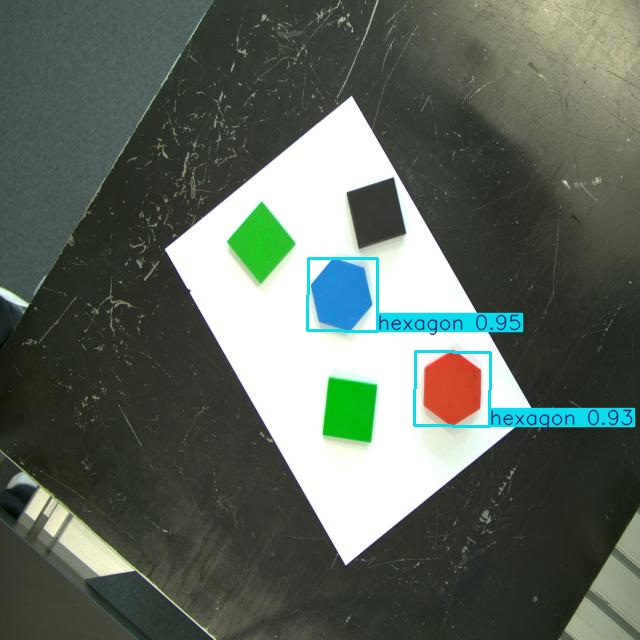

None


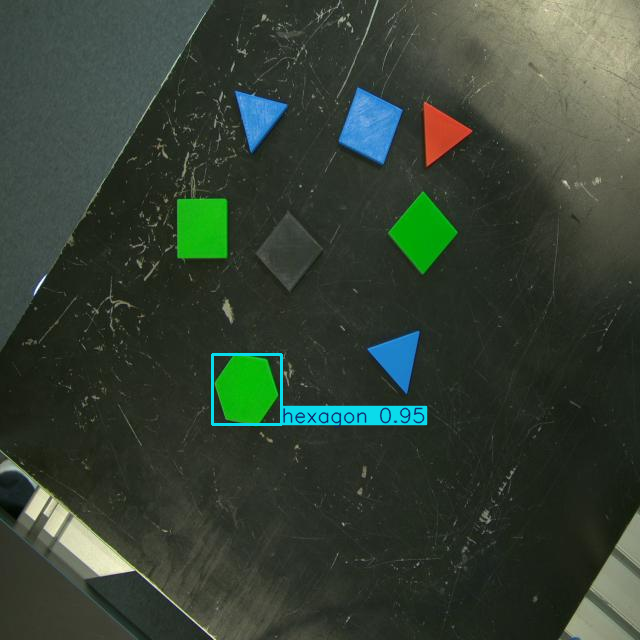

None


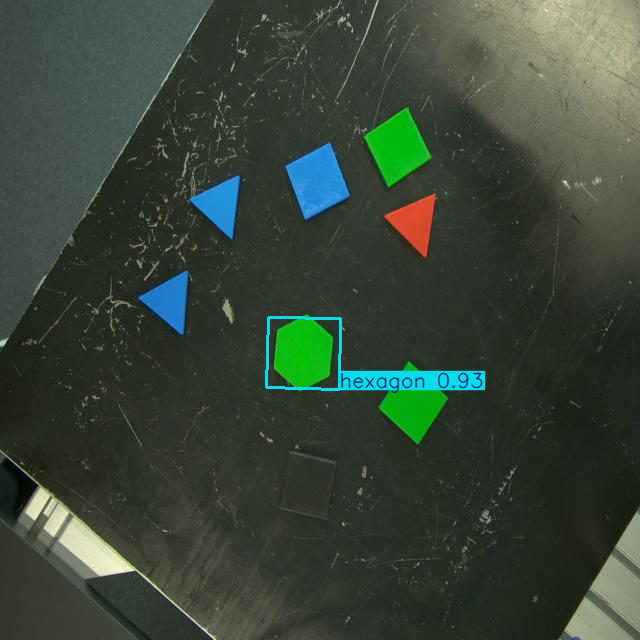

None


In [9]:
from ultralytics import YOLO

# Load a model
model = YOLO("/content/runs/obb/train/weights/best.pt")  # load a custom model

# Predict with the model
results = model("/content/OBB-1/test/images")  # predict on an image

# Access the results
for result in results:
    print(result.show())
    xywhr = result.obb.xywhr  # center-x, center-y, width, height, angle (radians)
    xyxyxyxy = result.obb.xyxyxyxy  # polygon format with 4-points
    names = [result.names[cls.item()] for cls in result.obb.cls.int()]  # class name of each box
    confs = result.obb.conf  # confidence score of each box

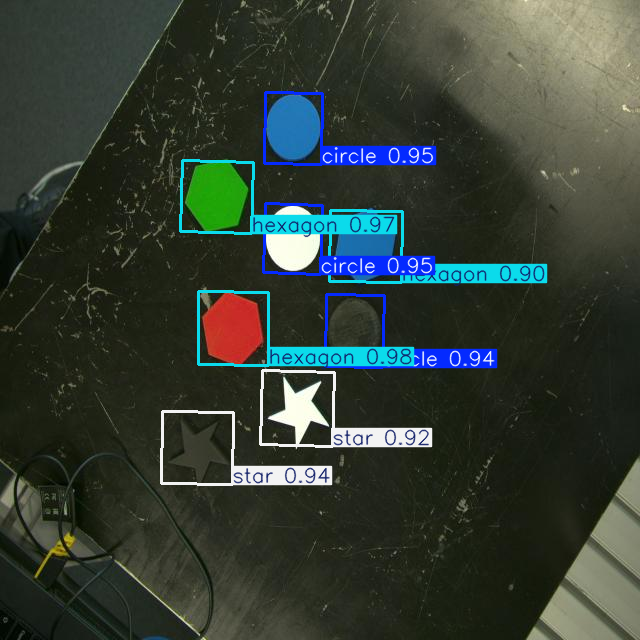

In [10]:
results[0].show()

In [11]:
from IPython.display import Image

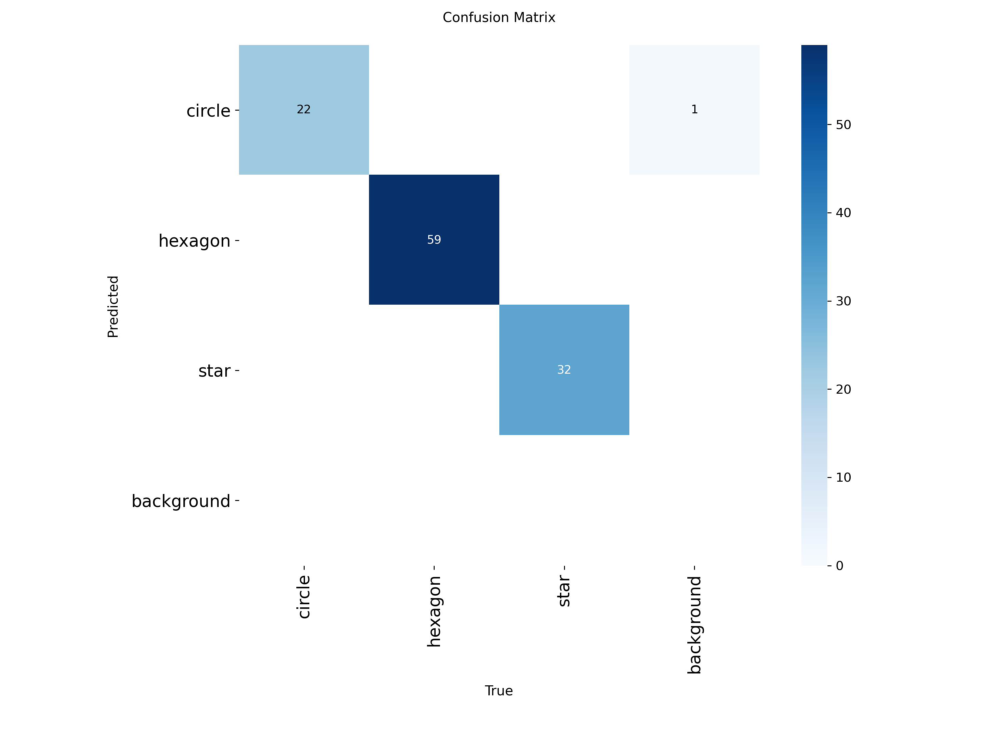

In [12]:
Image("/content/runs/obb/train/confusion_matrix.png", width=800)